<a href="https://colab.research.google.com/github/Dahlia-Chehata/COVID-19-measures/blob/main/STAT_946_Final_Project_Covid19_(Baseline_LSTM).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# STAT 946 Final Project

## 1. Data Preparation

### 1.1 Merging the Datasets

In [ ]:
import numpy as np
import random
import pandas as pd
from pylab import mpl, plt
plt.style.use('seaborn')
mpl.rcParams['font.family'] = 'serif'
%matplotlib inline

from pandas import datetime
import math, time
import itertools
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
import datetime
from operator import itemgetter
from sklearn.metrics import mean_squared_error
from math import sqrt
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import TensorDataset, random_split, DataLoader

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  if __name__ == '__main__':


In [ ]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla V100-SXM2-16GB


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dir = '/content/drive/MyDrive/STAT946: Project/'

In [ ]:
import pandas as pd

regulations = pd.read_excel('/content/drive/MyDrive/data/acaps_covid19_government_measures_dataset_0.xlsx', sheet_name = 'Dataset')
cases = pd.read_csv('/content/drive/MyDrive/data/archive/covid_19_data.csv')

In [ ]:
regulations.head()

In [ ]:
cases.head(200)

In [ ]:
import numpy as np
np.unique(cases['Country/Region'])

np.unique(regulations['COUNTRY'])

np.setdiff1d(cases['Country/Region'], regulations['COUNTRY'])

array([' Azerbaijan', "('St. Martin',)", 'Andorra', 'Aruba',
       'Bahamas, The', 'Burma', 'Cabo Verde', 'Cayman Islands',
       'Central African Republic', 'Channel Islands',
       'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Curacao',
       'Diamond Princess', 'East Timor', 'Faroe Islands', 'French Guiana',
       'Gambia, The', 'Gibraltar', 'Greenland', 'Guadeloupe', 'Guam',
       'Guernsey', 'Holy See', 'Ivory Coast', 'Jersey', 'Kosovo',
       'MS Zaandam', 'Macau', 'Mainland China', 'Martinique', 'Mayotte',
       'Monaco', 'North Ireland', 'North Macedonia', 'Others',
       'Puerto Rico', 'Republic of Ireland', 'Republic of the Congo',
       'Reunion', 'Saint Barthelemy', 'Saint Kitts and Nevis',
       'Saint Lucia', 'Saint Vincent and the Grenadines', 'South Korea',
       'St. Martin', 'Taiwan', 'The Bahamas', 'The Gambia', 'Timor-Leste',
       'UK', 'US', 'Vatican City', 'West Bank and Gaza',
       'occupied Palestinian territory'], dtype=object)

We want to join on Country and Date, but we can see that there are some naming differences between the countries in the `cases` dataset and the `regulations` dataset.

In [ ]:
np.setdiff1d(regulations['COUNTRY'], cases['Country/Region'])

array(['CAR', 'China', 'Congo', "CÃ´te d'Ivoire", 'DPRK', 'DRC',
       'Kiribati', 'Korea, Republic of', 'Macedonia', 'Micronesia',
       'Myanmar', 'Nauru', 'Palau', 'St. Kitts and Nevis', 'St. Lucia',
       'St. Vincent and the Grenadines', 'Timor Leste', 'Tonga',
       'Turkmenistan', 'Tuvalu', 'United Kingdom', 'United States'],
      dtype=object)

In [ ]:
old = ['Mainland China', 
       'US', 
       'UK', 
       'Saint Vincent and the Grenadines', 
       'Saint Lucia', 
       'Saint Kitts and Nevis',
       'North Macedonia',
       'Congo (Brazzaville)', 
       'Congo (Kinshasa)',
       'Republic of Ireland',
       'North Ireland',
       'West Bank and Gaza',
       'occupied Palestinian territory',
       'Guernsey',
       'Jersey',
       'Channel Islands',
       'Cayman Islands',
       'Diamond Princess',
       'Aruba',
       'Curacao',
       'Saint Martin',
       'St. Martin',
       "('St. Martin',)",
       'Guadeloupe',
       'Martinique',
       'Mayotte',
       'Reunion',
       'Saint Barthelemy',
       'Republic of the Congo',
       'East Timor',
       'Greenland',
       'Faroe Islands',
       'French Guiana',
       'Gibraltar',
       'Gambia, The',
       'The Gambia',
       'Cabo Verde',
       'Guam',
       'Puerto Rico',
       'Macau',
       'MS Zaandam',
       'The Bahamas',
       'Bahamas, The',
       ' Azerbaijan',
       'Vatican City',
       'Burma',
       "Cote d'Ivoire",
       'Korea, South',
       'Republic of Korea',
       'Iran (Islamic Republic of)',
       'Taipei and environs',
       'Taiwan*',
       'Hong Kong SAR',
       'Russian Federation',
       'Czechia',
       'Macao SAR',
       'Viet Nam',
       'Republic of Moldova',
       ]

new = ['China',
       'United States',
       'United Kingdom',
       'St. Vincent and the Grenadines',
       'St. Lucia',
       'St. Kitts and Nevis',
       'Macedonia',
       'Congo',
       'Congo',
       'Ireland',
       'Ireland',
       'Palestine',
       'Palestine',
       'United Kingdom',
       'United Kingdom',
       'United Kingdom',
       'United Kingdom',
       'United Kingdom',
       'Netherlands',
       'Netherlands',
       'France',
       'France',
       'France',
       'France',
       'France',
       'France',
       'France',
       'France',
       'Congo',
       'Timor-Leste',
       'Denmark',
       'Denmark',
       'Denmark',
       'Denmark',
       'Gambia',
       'Gambia',
       'Cape Verde',
       'United States',
       'United States',
       'China',
       'Netherlands',
       'Bahamas',
       'Bahamas',
       'Azerbaijan',
       'Holy See',
       'Myanmar',
       'Ivory Coast',
       'South Korea',
       'South Korea',
       'Iran',
       'Taiwan',
       'Taiwan',
       'Hong Kong',
       'Russia',
       'Czech Republic',
       'China',
       'Vietnam',
       'Moldova',
       ]
cases = cases.replace(old, new)

In [ ]:
old = ['Korea, Republic of',
       'DPRK',
       'DRC',
       'CAR',
       "CÃ´te d'Ivoire",
       'Timor Leste',
       ]

new = ['South Korea',
       'North Korea',
       'Congo',
       'Central African Republic',
       'Ivory Coast',
       'Timor-Leste'
       ]
regulations = regulations.replace(old, new)

Another issue is that the maximum granularity of the `regulations` dataset is `COUNTRY`, but the `cases` dataset is given by `Province/State`. One solution is to sum all cases by `Province/State` to the level of `Country/Region`.

In [ ]:
cases_by_country = cases.groupby(['Country/Region', 'ObservationDate']).sum(['Confirmed', 'Deaths', 'Recovered']).drop(['SNo'], axis = 1)
cases_by_country.reset_index(level=['Country/Region', 'ObservationDate'], inplace=True)

cases_by_country.head()

In [ ]:
regulations[(regulations['DATE_IMPLEMENTED'] == pd.to_datetime('2020-02-24')) & (regulations['COUNTRY'] == 'Afghanistan')]

We have that multiple measures were implemented on the same date. Therefore we should concatenate them into a single string.

In [ ]:
dropped_comments = regulations.dropna(subset = ['COMMENTS'])
dropped_categories = regulations.dropna(subset = ['CATEGORY'])

measures = regulations.groupby(['COUNTRY', 'DATE_IMPLEMENTED'])['MEASURE'].apply('. '.join).reset_index()
comments = dropped_comments.groupby(['COUNTRY', 'DATE_IMPLEMENTED'])['COMMENTS'].apply('. '.join).reset_index()
category = dropped_categories.groupby(['COUNTRY', 'DATE_IMPLEMENTED'])['CATEGORY'].apply('. '.join).reset_index()

measures_and_comments = pd.merge(measures, comments, how = 'left')
all = pd.merge(measures_and_comments, category, how = 'left')
all.head()

If we want to merge the datasets by date, we need to change the format of the `ObservationDate` series in `cases` to a `datetime` type.

In [ ]:
cases_by_country['ObservationDate'] = pd.to_datetime(cases_by_country['ObservationDate'])
cases_by_country.head()

In [ ]:
data = pd.merge(all, cases_by_country, left_on = ['COUNTRY', 'DATE_IMPLEMENTED'], right_on = ['Country/Region', 'ObservationDate'], how = 'right')

Assumption to be made is that the last regulation is in place until the next regulation is in place. Therefore we fill missing values using forward fill.

In [ ]:
data = data.sort_values(['Country/Region', 'ObservationDate']).fillna(method = 'ffill')
data = data.groupby('Country/Region').transform(lambda v: v.ffill())
data.head()

We can drop the duplicate columns:

In [ ]:
data = data.drop(labels = ['DATE_IMPLEMENTED'], axis = 1).dropna(subset = ['MEASURE'])
data = data.sort_values(['COUNTRY', 'ObservationDate'])
data.head(50)

In [ ]:
data.to_csv(dir + 'new_cleaned_data.csv', index=False)

Index(['COUNTRY', 'MEASURE', 'COMMENTS', 'CATEGORY', 'ObservationDate',
       'Confirmed', 'Deaths', 'Recovered'],
      dtype='object')

This is the final sequential dataset.

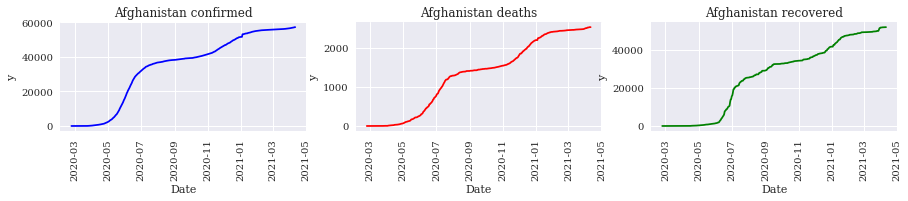

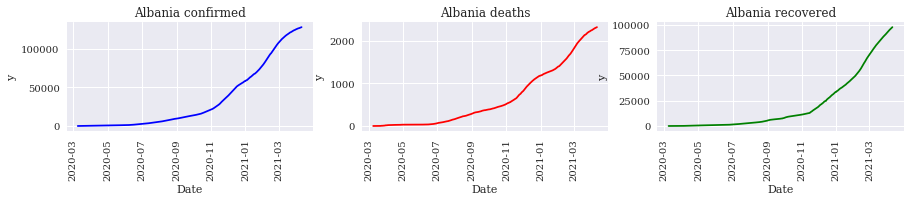

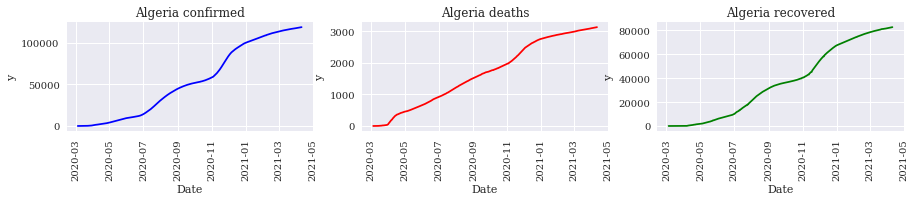

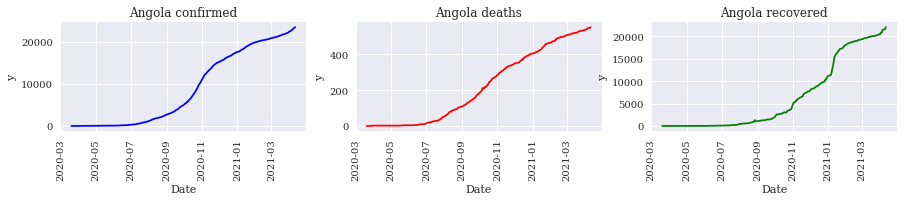

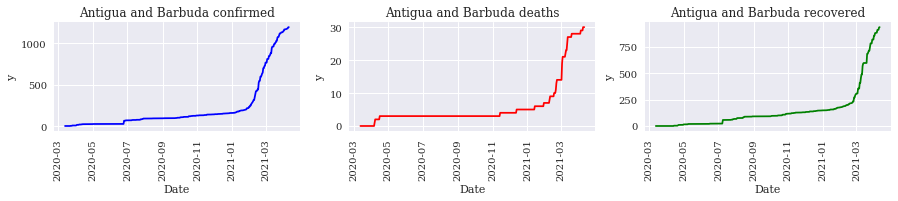

...

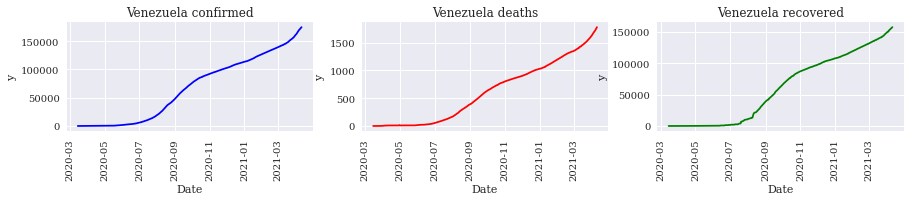

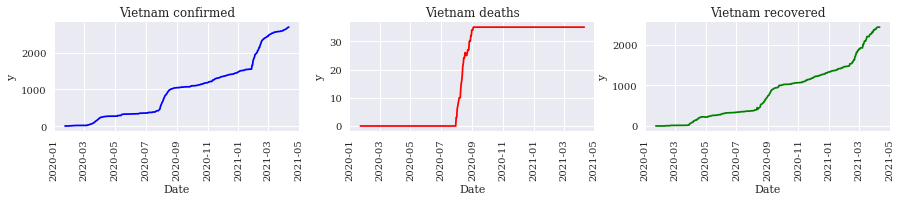

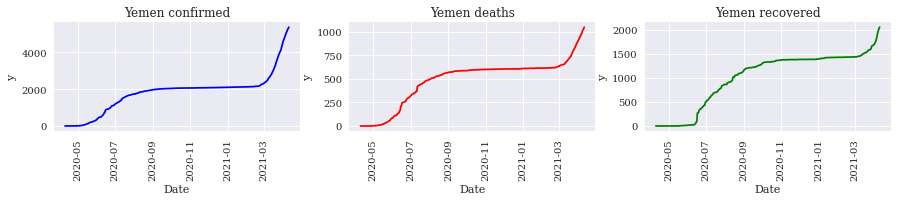

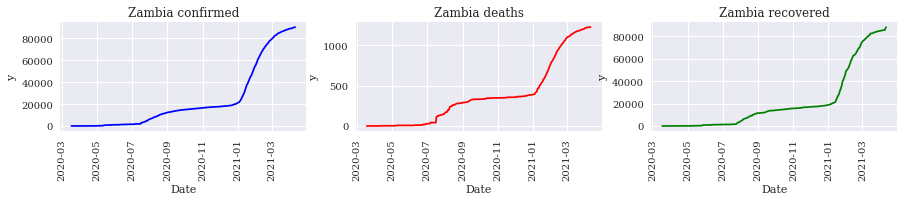

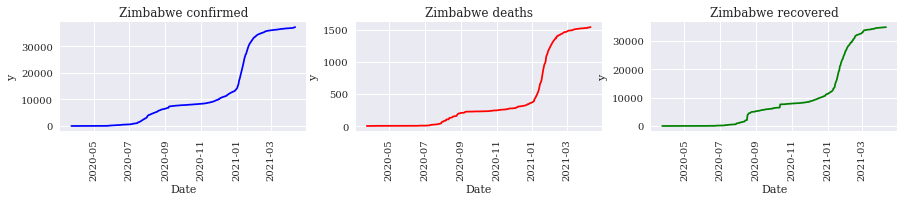

In [ ]:
for country in sorted(list(set(data['COUNTRY'])))[:]:
  country_case = data.loc[data['COUNTRY'] == country][['ObservationDate','Confirmed','Deaths', 'Recovered']]
  country_case['ObservationDate'] = pd.to_datetime(country_case.ObservationDate)
  country_case = country_case.sort_values(by=['ObservationDate'])
  date = country_case['ObservationDate']
  confirmed = country_case['Confirmed']
  deaths = country_case['Deaths']
  recovered = country_case['Recovered']

  plt.figure(figsize=[15,2])
  plt.subplot(1,3,1)
  plt.plot(date, confirmed,'b')
  plt.xlabel('Date') 
  plt.ylabel('y') 
  plt.title(country + ' confirmed')
  plt.xticks(rotation=90)
  plt.subplot(1,3,2)
  plt.plot(date, deaths,'r')
  plt.xlabel('Date') 
  plt.ylabel('y') 
  plt.title(country + ' deaths')
  plt.xticks(rotation=90)
  plt.subplot(1,3,3)
  plt.plot(date, recovered,'g')
  plt.xlabel('Date') 
  plt.ylabel('y') 
  plt.title(country + ' recovered')
  plt.xticks(rotation=90)
  plt.show()

# 2. Baseline LSTM Modeling

In [ ]:
data = pd.read_csv (dir + 'new_cleaned_data.csv')

In [ ]:
import numpy as np
def load_data(look_back):  
  scaler = []
  len_train = []
  len_test = []
  i = 0
  result1 = []
  result2 = []
  result3 = []
  result4 = []

  for country in sorted(list(set(data['COUNTRY'])))[:]:
    dat = []
    country_case = data.loc[data['COUNTRY'] == country][['ObservationDate','Confirmed']]
    #scaler.append(MinMaxScaler(feature_range=(-1, 1)))
    #country_case['Trans'] = scaler[i].fit_transform(country_case['Confirmed'].values.reshape(-1,1))
    country_case['Trans'] = (country_case['Confirmed'] - country_case['Confirmed'].mean())/country_case['Confirmed'].std()
    data_raw = country_case.Trans.values # convert to numpy array
    for index in range(len(data_raw) - look_back): 
      dat.append(data_raw[index: index + look_back])

    dat = np.stack(dat);
    test_set_size = int(np.round(0.1*dat.shape[0]));
    train_set_size = dat.shape[0] - (test_set_size);   

    country_x_train = dat[:train_set_size,:-15,None]
    country_y_train = dat[:train_set_size,-15:,None]

    country_x_test = dat[train_set_size:,:-15,None]
    country_y_test = dat[train_set_size:,-15:,None]

    country_len_train = country_y_train.shape[0]
    country_len_test = country_y_test.shape[0]
    len_train.append(country_len_train)
    len_test.append(country_len_test)
    i+=1 
    result1.append(country_x_train)
    result2.append(country_y_train)
    result3.append(country_x_test)
    result4.append(country_y_test)

  x_train = np.concatenate(result1)
  y_train = np.concatenate(result2)
  x_test = np.concatenate(result3)
  y_test = np.concatenate(result4)

  return [x_train, y_train, x_test, y_test, len_train, len_test, scaler]

look_back = 45 # choose sequence length
x_train, y_train, x_test, y_test, len_train, len_test, scaler = load_data(look_back)
print('x_train.shape = ',x_train.shape)
print('y_train.shape = ',y_train.shape)
print('x_test.shape = ',x_test.shape)
print('y_test.shape = ',y_test.shape)

x_train.shape =  (60346, 30, 1)
y_train.shape =  (60346, 15, 1)
x_test.shape =  (6707, 30, 1)
y_test.shape =  (6707, 15, 1)


In [ ]:
x_train = torch.from_numpy(x_train).type(torch.Tensor)
x_test = torch.from_numpy(x_test).type(torch.Tensor)
y_train = torch.from_numpy(y_train).type(torch.Tensor)
y_test = torch.from_numpy(y_test).type(torch.Tensor)
y_train.size(), x_train.size(), y_test.size(), x_test.size()

(torch.Size([60346, 15, 1]),
 torch.Size([60346, 30, 1]),
 torch.Size([6707, 15, 1]),
 torch.Size([6707, 30, 1]))

In [ ]:
n_steps = look_back-1
batch_size = 32
num_epochs = 100 #n_iters / (len(train_X) / batch_size)

train = TensorDataset(x_train,y_train)
test = TensorDataset(x_test,y_test)

train_loader = DataLoader(dataset=train, 
                          batch_size=batch_size, 
                          shuffle=False)

test_loader = DataLoader(dataset=test, 
                         batch_size=batch_size, 
                         shuffle=False)

In [ ]:
import torch.nn as nn
input_dim = 1
hidden_dim = 32
num_layers = 2 
output_dim = 15

class LSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(LSTM, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        # batch_first=True causes input/output tensors to be of shape
        # (batch_dim, seq_dim, feature_dim)
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))

        out = self.fc(out[:, -1, :]) 
        # out.size() --> 100, 10
        return out

model = LSTM(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)
loss_fn = torch.nn.MSELoss()
optimiser = torch.optim.Adam(model.parameters(), lr=0.01)
print(model)
print(len(list(model.parameters())))
for i in range(len(list(model.parameters()))):
    print(list(model.parameters())[i].size())

LSTM(
  (lstm): LSTM(1, 32, num_layers=2, batch_first=True)
  (fc): Linear(in_features=32, out_features=15, bias=True)
)
10
torch.Size([128, 1])
torch.Size([128, 32])
torch.Size([128])
torch.Size([128])
torch.Size([128, 32])
torch.Size([128, 32])
torch.Size([128])
torch.Size([128])
torch.Size([15, 32])
torch.Size([15])


In [ ]:
# Train model
#####################

hist = np.zeros(num_epochs)

# Number of steps to unroll
seq_dim =look_back-1  

seed_val = 42
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

for t in range(num_epochs):
    
    # Forward pass
    y_train_pred = model(x_train)
    y_train = torch.squeeze(y_train)
    loss = loss_fn(y_train_pred, y_train)
    if t % 10 == 0 and t !=0:
        print("Epoch ", t, "MSE: ", loss.item())
    hist[t] = loss.item()

    optimiser.zero_grad()

    # Backward pass
    loss.backward()

    # Update parameters
    optimiser.step()

Epoch  10 MSE:  0.16126534342765808
Epoch  20 MSE:  0.08882416784763336
Epoch  30 MSE:  0.0463225357234478
Epoch  40 MSE:  0.043553851544857025
Epoch  50 MSE:  0.04036612808704376
Epoch  60 MSE:  0.0395975299179554
Epoch  70 MSE:  0.03902316093444824
Epoch  80 MSE:  0.03845512121915817
Epoch  90 MSE:  0.0378870852291584


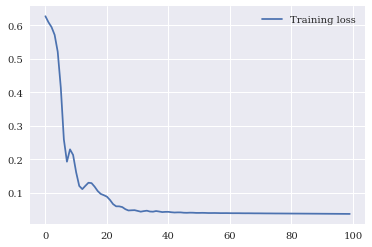

In [ ]:
from pylab import mpl, plt
plt.plot(hist, label="Training loss")
plt.legend()
plt.show()

In [ ]:
y_test_pred = model(x_test)

# invert predictions
y_train_pred = y_train_pred.detach().numpy()
y_train = y_train.detach().numpy()
y_test_pred = y_test_pred.detach().numpy()
y_test = y_test.detach().numpy()

In [ ]:
# calculate mean squared error
trainScore = mean_squared_error(y_train[:,:], y_train_pred[:,:])
print('Train Score: %.4f MSE' % (trainScore))
testScore = mean_squared_error(np.squeeze(y_test)[:,:], y_test_pred[:,:])
print('Test Score: %.4f MSE' % (testScore))

Train Score: 0.0373 MSE
Test Score: 0.1665 MSE


In [ ]:
# Visualising the results
figure, axes = plt.subplots(figsize=(15, 6))
axes.xaxis_date()

axes.plot(data['Confirmed'][len(data['Confirmed'])-len(y_test):].index, y_test[:,0], color = 'red', label = 'Real confirmed cases')
axes.plot(data['Confirmed'][len(data['Confirmed'])-len(y_test):].index, y_test_pred[:,0], color = 'blue', label = 'Predicted confirmed cases')
#axes.xticks(np.arange(0,394,50))
plt.title('Confirmed cases')
plt.xlabel('Time')
plt.ylabel('Confirmed cases')
plt.legend()
#plt.savefig('ibm_pred.png')
plt.show()

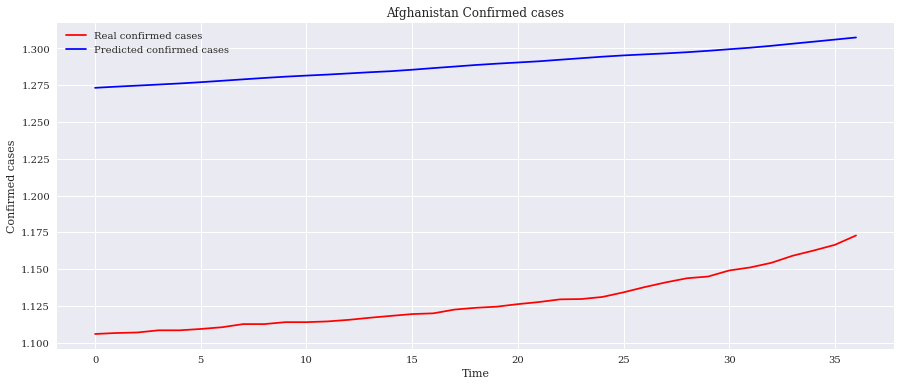

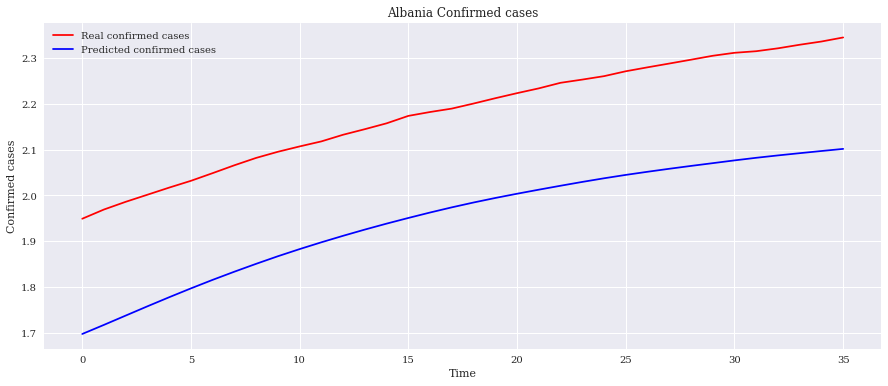

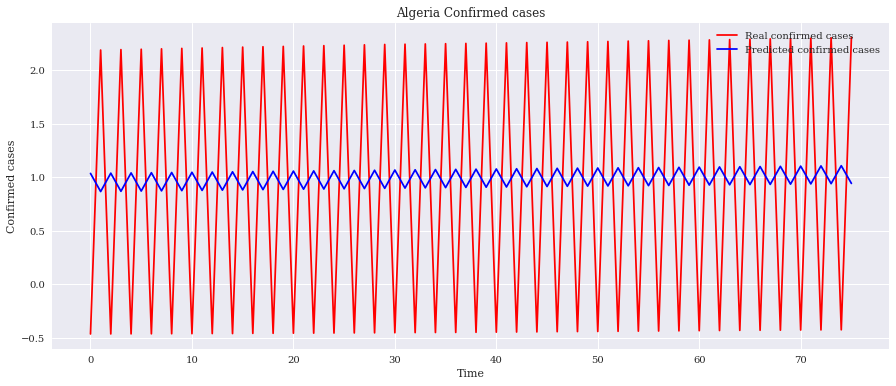

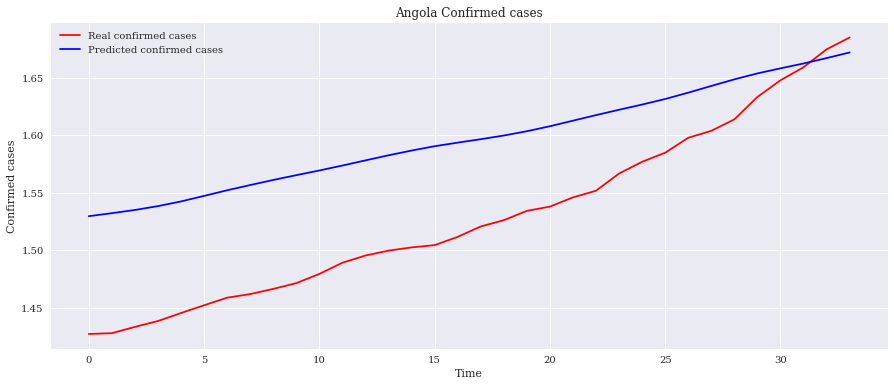

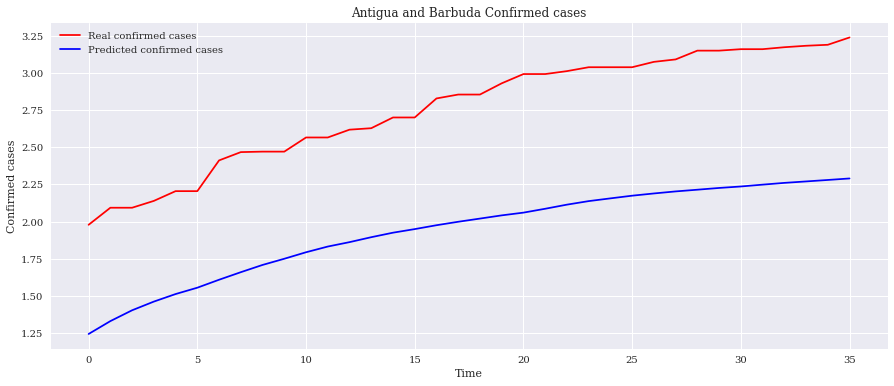

...

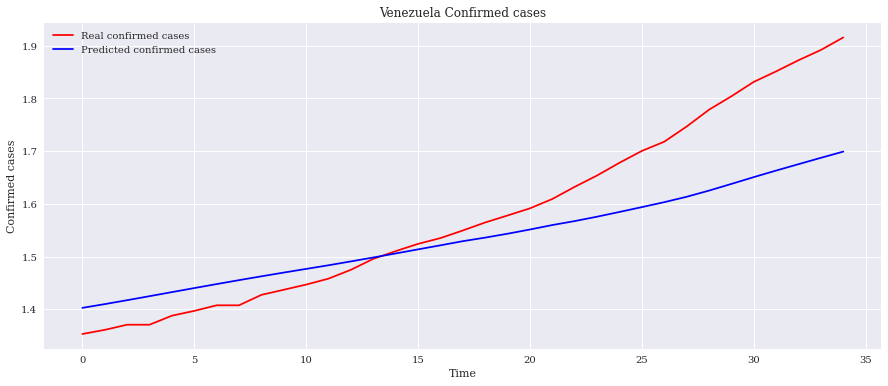

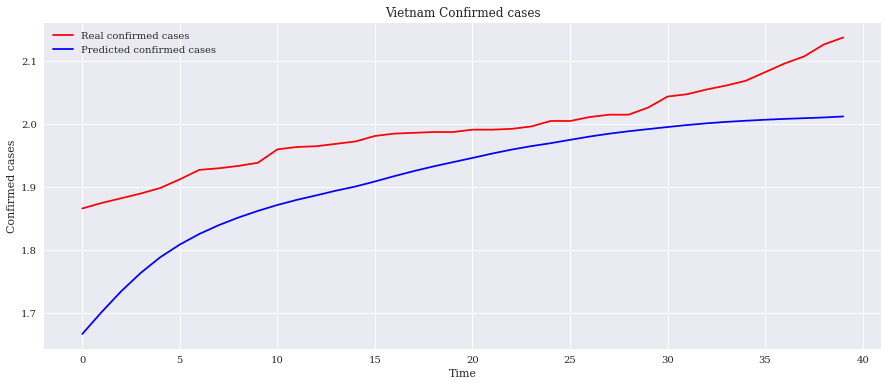

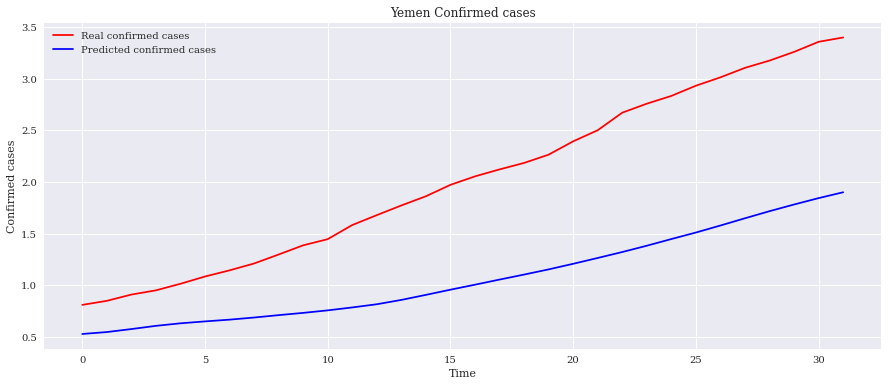

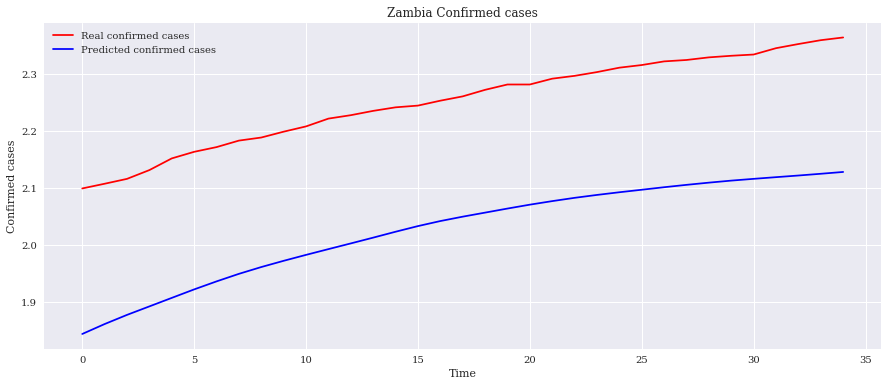

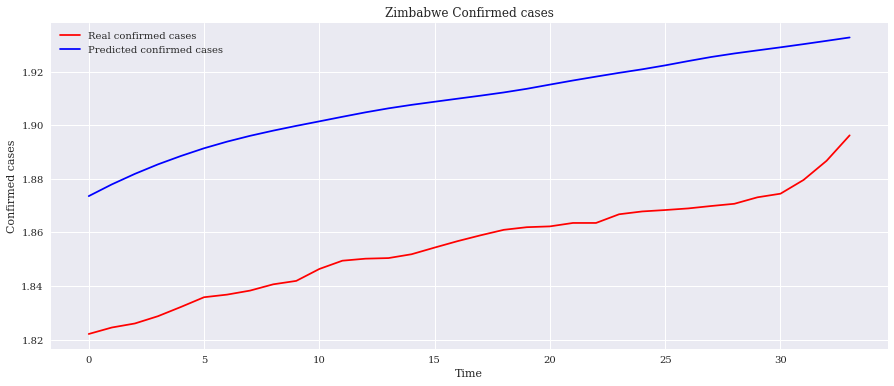

In [ ]:
seq_total_test=0
i=0
for country in sorted(list(set(data['COUNTRY'])))[:]:
  country_case = data.loc[data['COUNTRY'] == country][['ObservationDate','Confirmed']]
  figure, axes = plt.subplots(figsize=(15, 6))

  plt.plot(range(len_test[i]), y_test[seq_total_test:seq_total_test + len_test[i],-1], color = 'red', label = 'Real confirmed cases')
  plt.plot(range(len_test[i]), y_test_pred[seq_total_test:seq_total_test + len_test[i],-1], color = 'blue', label = 'Predicted confirmed cases')
  plt.title(country + ' Confirmed cases')
  plt.xlabel('Time')
  plt.ylabel('Confirmed cases')
  plt.legend()
  plt.show()
  seq_total_test += len_test[i]
  i+=1